# Visualization

This notebook will show some visualizations for the project
1. Visualization of raw image of 5 target classes
2. Train, val, test data distribution
3. Image augmentation done on train images for model training
4. Model predictions on test dataset
5. Confusion matrix of model prediction on test dataset

In [20]:
import warnings
warnings.filterwarnings("ignore") 

In [43]:
import torch
import torch.nn as nn
import torchvision.models as models
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from tqdm import tqdm

In [3]:
class FoodDataset(Dataset):
    def __init__(self, file, transform=None, mode="train"):
        self.transforms = transform
        self.mode = mode
        with open(file, "r") as f:
            self.image_list = f.readlines()

    def __len__(self):
        return len(self.image_list)

    def __getitem__(self, index):
        label = None
        img_path = self.image_list[index].split("\n")[0].split("\t")[0]
        if self.mode == "train":
            image, label = self.image_list[index].split("\n")[0].split("\t")
            label = int(label)
        else:
            image = self.image_list[index].split("\n")[0]
        image = Image.open(image).convert("RGB")
        image = self.transforms(image)
        if self.mode == "train":
            return img_path, image, label
        else:
            return image

# 1. Image samples from 5 target classes

The classes that we used in this project are 
- Bak Chor Mee
- Char Kway Teow
- Chicken Rice
- Satay
- Oyster Omelette

In [32]:
# Meiqi's code

#  2. Train, val, test image distribution

In [33]:
# Meiqi's code

# 3. Image augmentation performed on train images

We have performed image augmentation on train images to provide more variations of data during training. This prevents overfitting and allow model to better predict in unseen images with different variations.

Most augmentations are done randomly for every batch of images.

Some transformation techniques are:
1. Resize images to 224px X 224px
2. Horizontal flip
3. Vertical flip
4. Padding
5. Rotation
6. Crop
7. Color adjustment


In [34]:
transforms_train = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomVerticalFlip(p=0.5),
        transforms.Pad(10, 10),
        transforms.RandomRotation(45),
        transforms.RandomCrop((224, 224)),
        transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5),
        transforms.ToTensor(),
    ]
)

train_ds = FoodDataset("./data/train.txt", transform=transforms_train)
train_dl = DataLoader(train_ds, batch_size=32, shuffle=True, num_workers=8)

In [35]:
classes =  [
    "Bak Chor Mee",
    "Char Kway Teow",
    "Chicken Rice",
    "Satay",
    "Oyster Omelette",
]

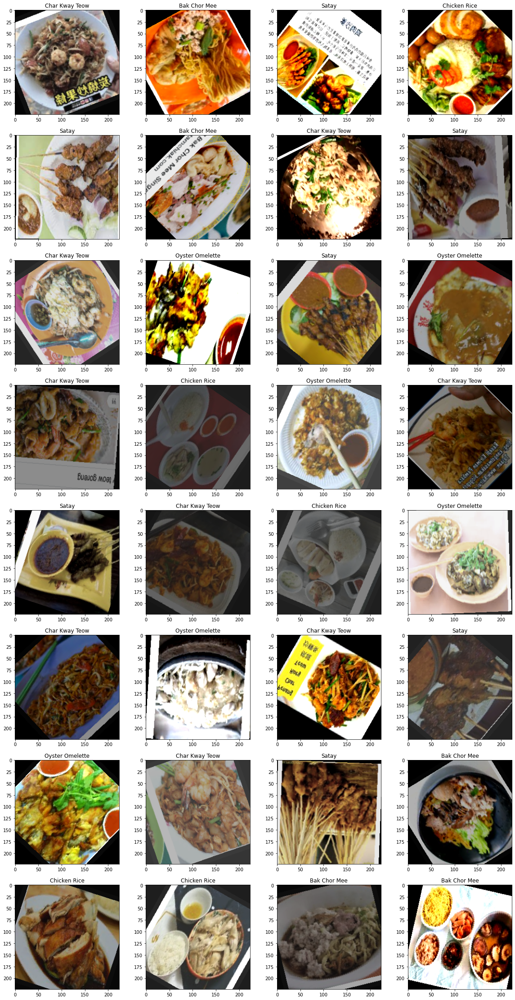

In [41]:
nrows = 8
ncols = 4

fig = plt.gcf()
fig.set_size_inches(ncols*5, nrows*5)

for batch_path, batch_images, batch_labels in train_dl:
    for i in range(len(batch_images)):
        sp = plt.subplot(nrows, ncols, i + 1)
        plt.title(classes[batch_labels[i]])
        plt.imshow(batch_images[i].permute(1, 2, 0))
    break

plt.show()

# 4. Visualizing model prediction
    - what are some correctly predicted images
    - what are some incorrectly predicted images

In [38]:
def get_model(model_name, model_path, num_classes):
    if model_name == "resnet50":
        model = models.resnet50(pretrained=True)
        model.fc = nn.Linear(2048, num_classes)
    if model_name == "resnet34":
        model = models.resnet34(pretrained=True)
        model.fc = nn.Linear(512, num_classes)
    elif model_name == "vgg16":
        model = models.vgg16(pretrained=True)
        model.classifier[6] = nn.Linear(4096, num_classes)
    model.load_state_dict(torch.load(model_path))
    model.eval()
    return model

In [39]:
transforms_test = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]
)

test_ds = FoodDataset("./data/test.txt", transform=transforms_test)

In [40]:
cuda_num = 1
device = "cuda:{}".format(cuda_num) if torch.cuda.is_available() else "cpu"
num_classes = 5
model = get_model("resnet34", "checkpoint/resnet34/resnet34_final.pth", num_classes)
model.to(device)

results = list()

def calculate_entropy(output):
    x = -output * output.log()
    return x.sum(dim=1)

for img_path, img, label in tqdm(test_ds):
    with torch.no_grad():
        img = img.unsqueeze(0).to(device)
        lbl = torch.tensor(label).to(device)

        output = model(img)
        output = torch.nn.functional.softmax(output, dim=1)
        entropy = calculate_entropy(output)
        prediction = torch.argmax(output, dim=1)

        res = {
            "image_path": img_path,
            "true": label,
            "predicted": prediction.item(),
            "predicted_class_conf": round(torch.max(output).item(), 5),
            "entropy": round(entropy.item(), 5)
        }
        results.append(res)

results = pd.DataFrame(results)
results

100%|██████████| 1000/1000 [00:07<00:00, 138.02it/s]


,image_path,true,predicted,predicted_class_conf,entropy
0,data/test/Bak Chor Mee/Bak Chor Mee(2052).jpg,0,1,0.41805,1.20386
1,data/test/Bak Chor Mee/Bak Chor Mee(483).jpg,0,0,0.88421,0.51416
2,data/test/Bak Chor Mee/Bak Chor Mee(893).jpg,0,0,0.92911,0.35398
3,data/test/Bak Chor Mee/Bak Chor Mee(2044).jpg,0,0,0.93962,0.31020
4,data/test/Bak Chor Mee/Bak Chor Mee(1064).jpg,0,0,0.88906,0.49588
...,...,...,...,...,...
995,data/test/Oyster Omelette/Oyster Omelette(531)...,4,2,0.52622,1.16575
996,data/test/Oyster Omelette/Oyster Omelette(196)...,4,4,0.88642,0.50522
997,data/test/Oyster Omelette/Oyster Omelette(1596...,4,4,0.73373,0.91923
998,data/test/Oyster Omelette/Oyster Omelette(909)...,4,4,0.92649,0.36296


### Predicted as Bak Chor Mee

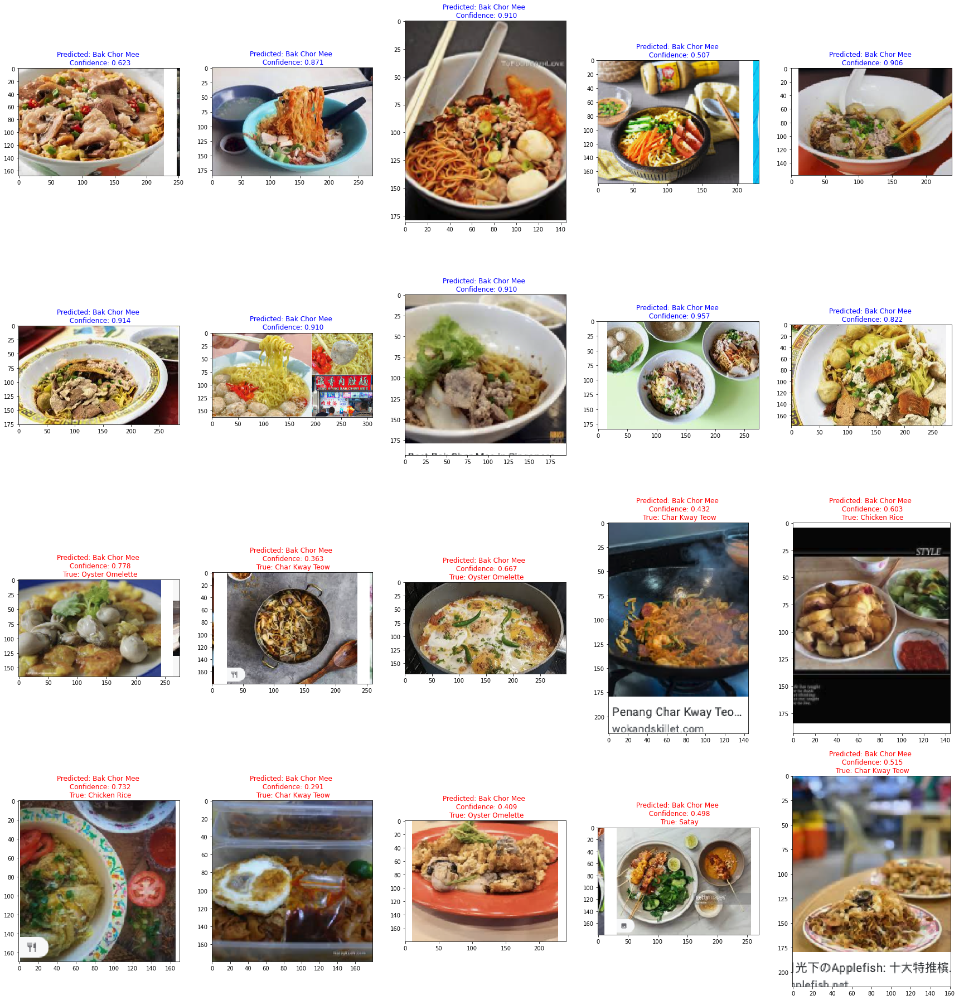

In [68]:
nrows = 4
ncols = 5

fig = plt.gcf()
fig.patch.set_facecolor('white')
fig.set_size_inches(ncols*6, nrows*8)

correct = results.loc[(results.true == 0) & (results.predicted == 0)].sample(n=10)
wrong = results.loc[(results.true != 0) & (results.predicted == 0)].sample(n=10)

img_paths = [img for img in list(correct.image_path)] + [img for img in list(wrong.image_path)]
confs = ["{:.3f}".format(conf) for conf in list(correct.predicted_class_conf)] + ["{:.3f}".format(conf) for conf in list(wrong.predicted_class_conf)]
true = [c for c in list(correct.true)] + [c for c in list(wrong.true)]

for i, img_path in enumerate(img_paths):
    sp = plt.subplot(nrows, ncols, i + 1)
    img = mpimg.imread(img_path)
    title = "Predicted: {} \n Confidence: {}".format(classes[0], confs[i])
    if true[i] != 0:
        title += "\n True: {}".format(classes[true[i]])
    plt.title(title, color="r" if true[i] != 0 else "b")
    plt.imshow(img, interpolation='nearest')

plt.show()

### Predicted as Char Kway Teow

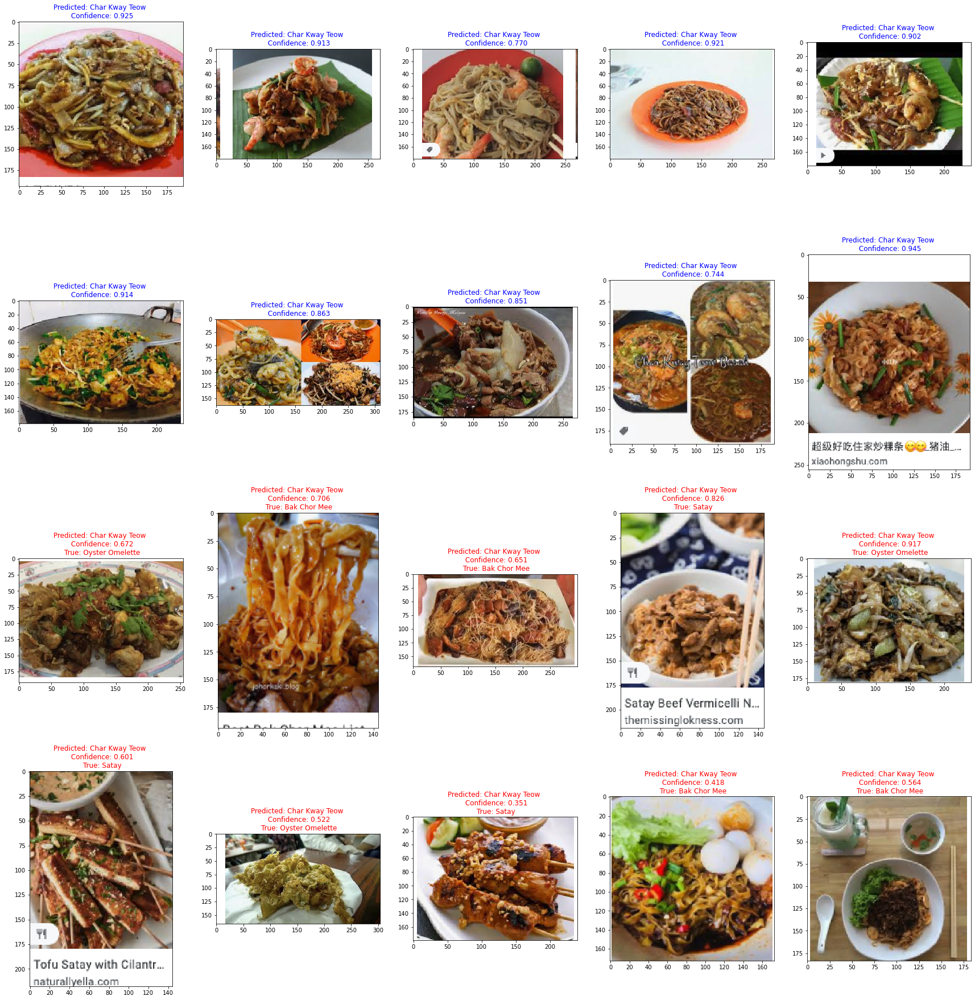

In [66]:
nrows = 4
ncols = 5

fig = plt.gcf()
fig.patch.set_facecolor('white')
fig.set_size_inches(ncols*6, nrows*8)

correct = results.loc[(results.true == 1) & (results.predicted == 1)].sample(n=10)
wrong = results.loc[(results.true != 1) & (results.predicted == 1)].sample(n=10)

img_paths = [img for img in list(correct.image_path)] + [img for img in list(wrong.image_path)]
confs = ["{:.3f}".format(conf) for conf in list(correct.predicted_class_conf)] + ["{:.3f}".format(conf) for conf in list(wrong.predicted_class_conf)]
true = [c for c in list(correct.true)] + [c for c in list(wrong.true)]

for i, img_path in enumerate(img_paths):
    sp = plt.subplot(nrows, ncols, i + 1)
    img = mpimg.imread(img_path)
    title = "Predicted: {} \n Confidence: {}".format(classes[1], confs[i])
    if true[i] != 1:
        title += "\n True: {}".format(classes[true[i]])
    plt.title(title, color="r" if true[i] != 1 else "b")
    plt.imshow(img, interpolation='nearest')

plt.show()

### Predicted as Chicken Rice

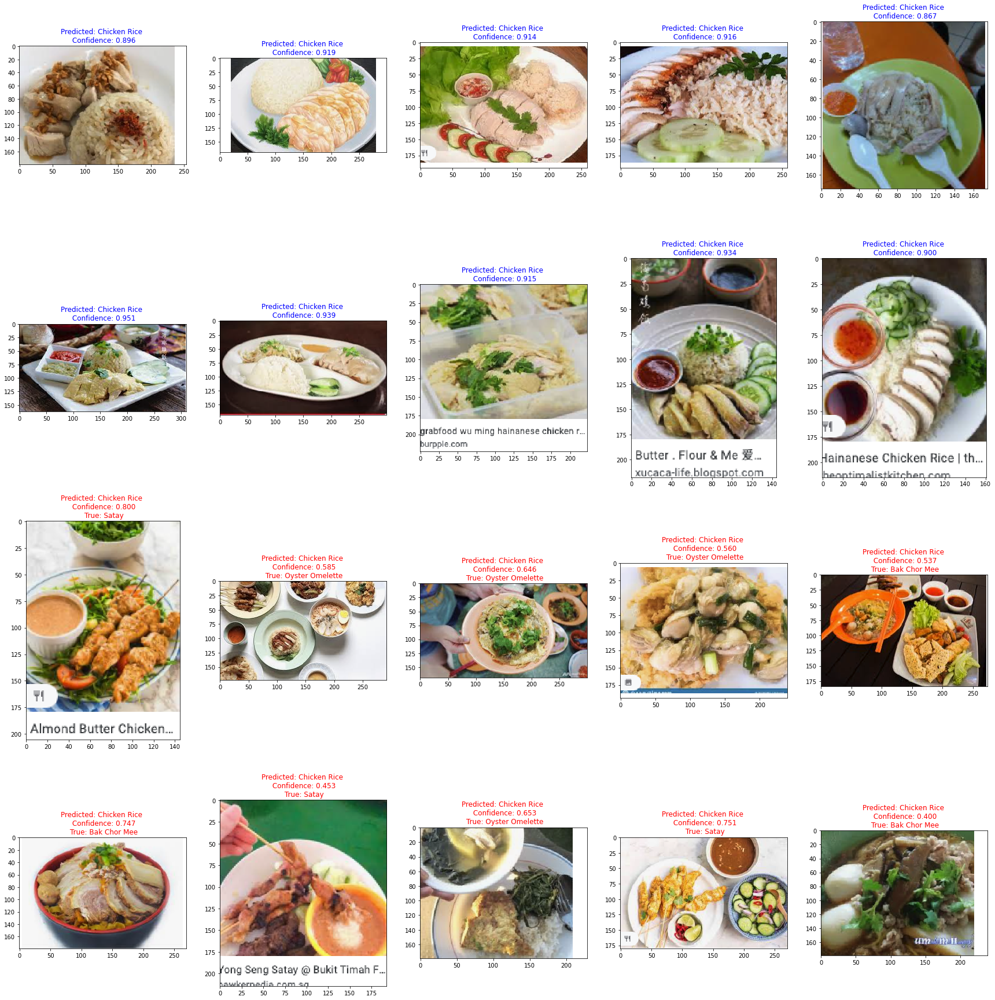

In [67]:
nrows = 4
ncols = 5

fig = plt.gcf()
fig.patch.set_facecolor('white')
fig.set_size_inches(ncols*6, nrows*8)

correct = results.loc[(results.true == 2) & (results.predicted == 2)].sample(n=10)
wrong = results.loc[(results.true != 2) & (results.predicted == 2)].sample(n=10)

img_paths = [img for img in list(correct.image_path)] + [img for img in list(wrong.image_path)]
confs = ["{:.3f}".format(conf) for conf in list(correct.predicted_class_conf)] + ["{:.3f}".format(conf) for conf in list(wrong.predicted_class_conf)]
true = [c for c in list(correct.true)] + [c for c in list(wrong.true)]

for i, img_path in enumerate(img_paths):
    sp = plt.subplot(nrows, ncols, i + 1)
    img = mpimg.imread(img_path)
    title = "Predicted: {} \n Confidence: {}".format(classes[2], confs[i])
    if true[i] != 2:
        title += "\n True: {}".format(classes[true[i]])
    plt.title(title, color="r" if true[i] != 2 else "b")
    plt.imshow(img, interpolation='nearest')

plt.show()

### Predicted as satay

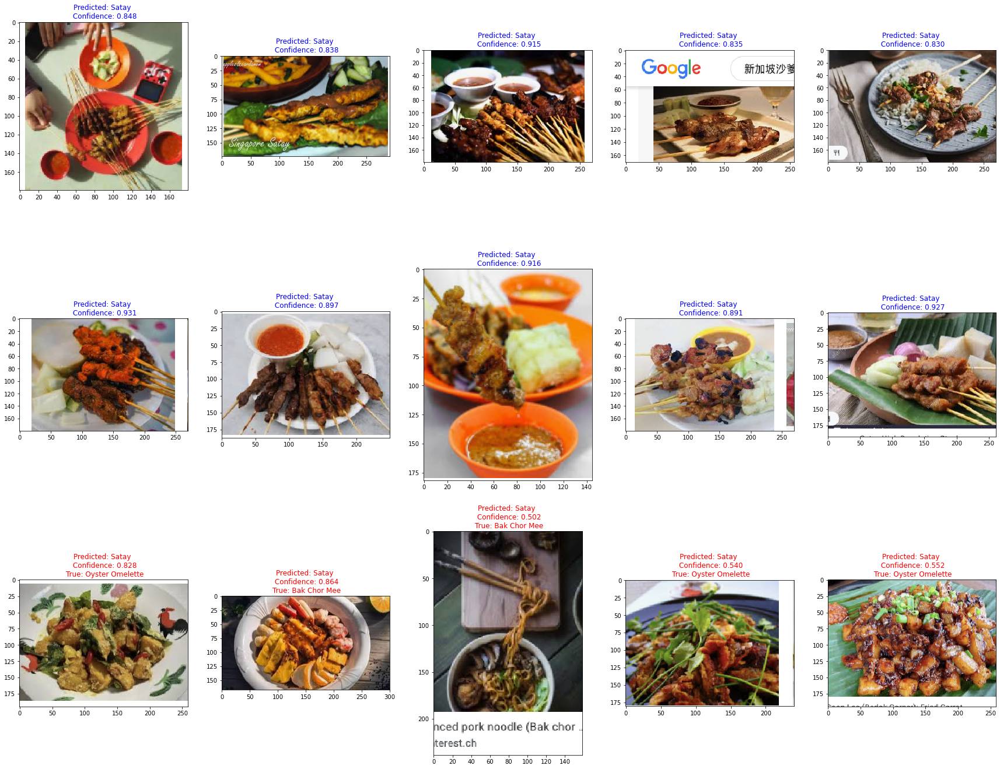

In [70]:
nrows = 3
ncols = 5

fig = plt.gcf()
fig.patch.set_facecolor('white')
fig.set_size_inches(ncols*6, nrows*8)

correct = results.loc[(results.true == 3) & (results.predicted == 3)].sample(n=10)
wrong = results.loc[(results.true != 3) & (results.predicted == 3)].sample(n=5)

img_paths = [img for img in list(correct.image_path)] + [img for img in list(wrong.image_path)]
confs = ["{:.3f}".format(conf) for conf in list(correct.predicted_class_conf)] + ["{:.3f}".format(conf) for conf in list(wrong.predicted_class_conf)]
true = [c for c in list(correct.true)] + [c for c in list(wrong.true)]

for i, img_path in enumerate(img_paths):
    sp = plt.subplot(nrows, ncols, i + 1)
    img = mpimg.imread(img_path)
    title = "Predicted: {} \n Confidence: {}".format(classes[3], confs[i])
    if true[i] != 3:
        title += "\n True: {}".format(classes[true[i]])
    plt.title(title, color="r" if true[i] != 3 else "b")
    plt.imshow(img, interpolation='nearest')

plt.show()

### Predicted as Oyster Omelette

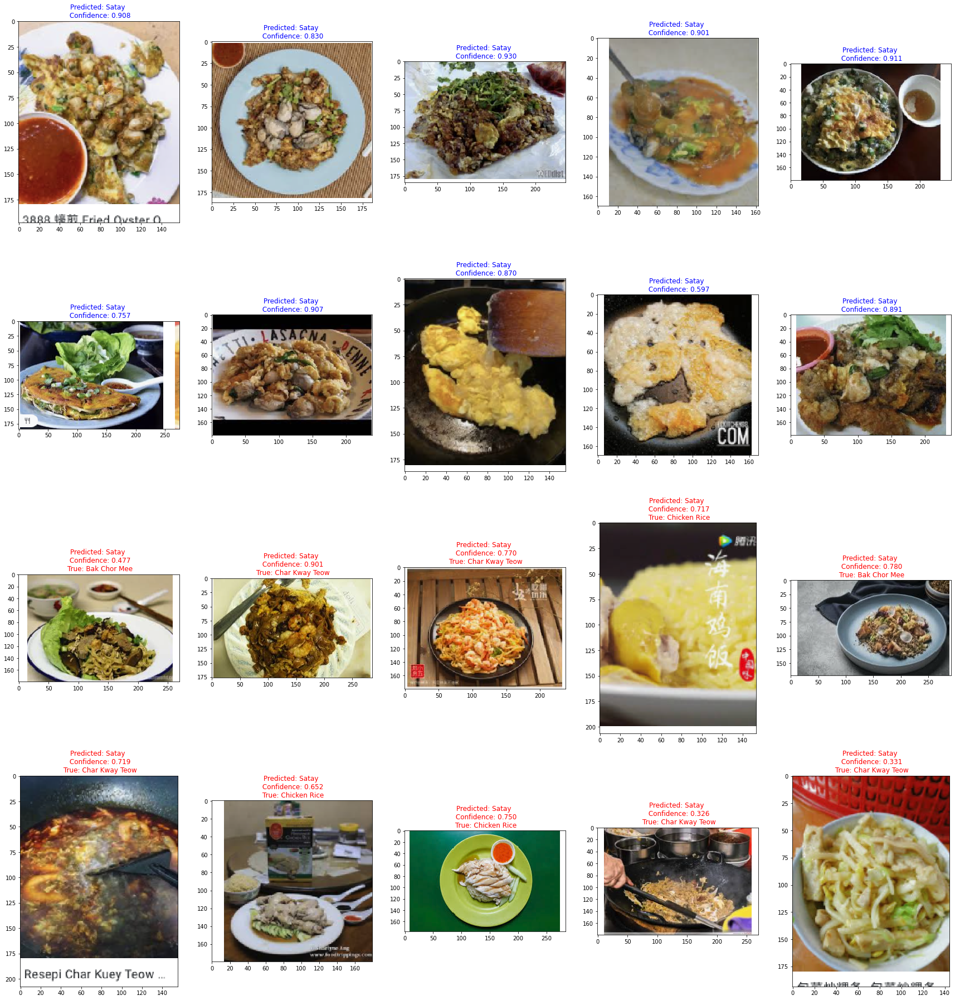

In [71]:
nrows = 4
ncols = 5

fig = plt.gcf()
fig.patch.set_facecolor('white')
fig.set_size_inches(ncols*6, nrows*8)

correct = results.loc[(results.true == 4) & (results.predicted == 4)].sample(n=10)
wrong = results.loc[(results.true != 4) & (results.predicted == 4)].sample(n=10)

img_paths = [img for img in list(correct.image_path)] + [img for img in list(wrong.image_path)]
confs = ["{:.3f}".format(conf) for conf in list(correct.predicted_class_conf)] + ["{:.3f}".format(conf) for conf in list(wrong.predicted_class_conf)]
true = [c for c in list(correct.true)] + [c for c in list(wrong.true)]

for i, img_path in enumerate(img_paths):
    sp = plt.subplot(nrows, ncols, i + 1)
    img = mpimg.imread(img_path)
    title = "Predicted: {} \n Confidence: {}".format(classes[3], confs[i])
    if true[i] != 4:
        title += "\n True: {}".format(classes[true[i]])
    plt.title(title, color="r" if true[i] != 4 else "b")
    plt.imshow(img, interpolation='nearest')

plt.show()

# 5. Confusion matrix of model prediction

In [72]:
from sklearn.metrics import confusion_matrix

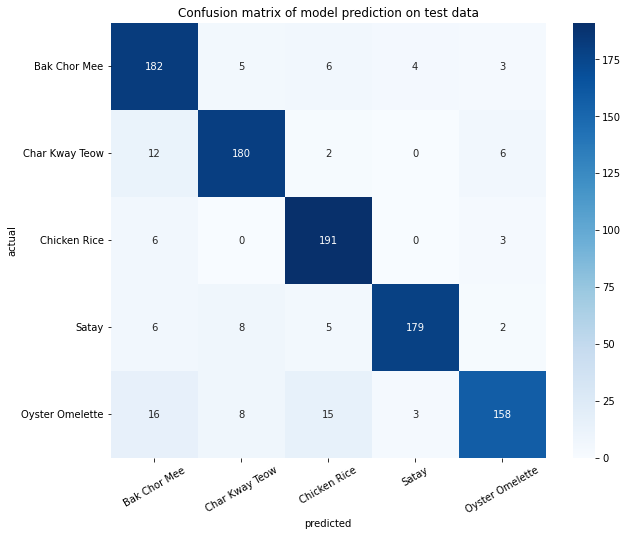

In [74]:
actualValue = results["true"]
predictedValue = results["predicted"]

actualValue = actualValue.values
predictedValue = predictedValue.values

cmt = confusion_matrix(actualValue, predictedValue)
fig, ax = plt.subplots(figsize=(10, 8))
fig.patch.set_facecolor('white')
sb.heatmap(cmt, cmap="Blues", annot=True, fmt=".0f", square=True)

# ticks
xticks = yticks = classes
plt.yticks(plt.yticks()[0], labels=yticks, rotation=0)
plt.xticks(plt.xticks()[0], labels=xticks, rotation=30)
plt.xlabel("predicted")
plt.ylabel("actual")
plt.title("Confusion matrix of model prediction on test data")

plt.show()